In [1]:
from allensdk.core.reference_space_cache import ReferenceSpaceCache
import matplotlib.pyplot as plt
import numpy as np
# from fish_helpers import *
reference_space_key = 'average_template'
resolution = 10 
rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest='manifest.json')
rsp = rspc.get_reference_space()
average_template = rsp.annotation
reference_space_key = 'ara_nissl'
resolution = 10 
rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest='manifest.json')
rsp = rspc.get_reference_space()
ara_nissl = rsp.annotation
reference_space_key = 'annotation/ccf_2017'
resolution = 10 
rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest='manifest.json')
rsp = rspc.get_reference_space()
# plt.imshow(rsp.get_slice_image(0, 7300), interpolation='none')
# plt.show()

http://help.brain-map.org/display/mouseconnectivity/API#API-3DReferenceModels

https://allensdk.readthedocs.io/en/latest/_static/examples/nb/reference_space.html

https://github.com/brainglobe/brainreg

In [11]:
rsp.annotation.shape

(1320, 800, 1140)

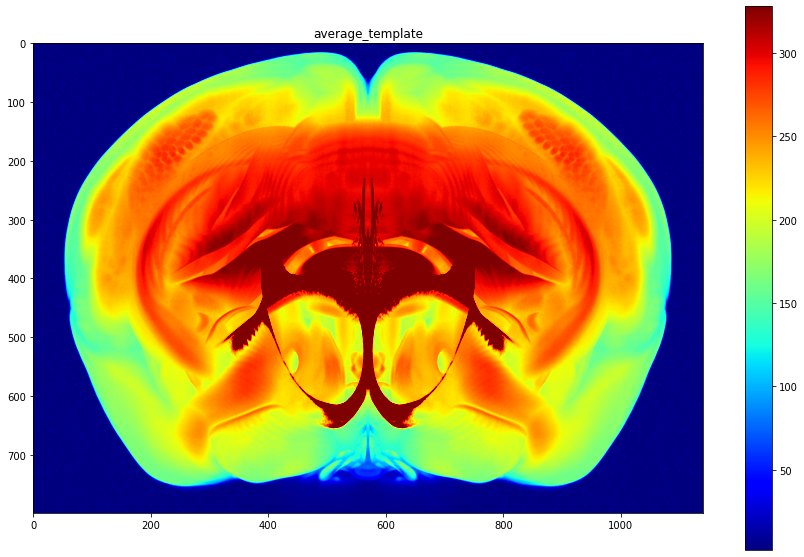

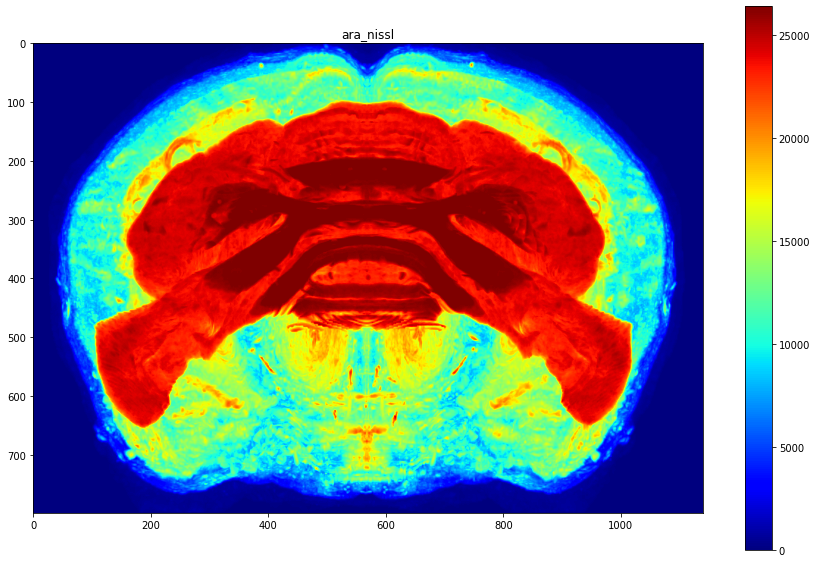

In [12]:
img = average_template.max(0).copy()
plt.figure(figsize=[15,10])
plt.title('average_template')
plt.imshow(img, cmap='jet',vmin=np.percentile(img.ravel(),5),vmax=np.percentile(img.ravel(),95))
plt.colorbar()
plt.show()

img = ara_nissl.max(0).copy()
plt.figure(figsize=[15,10])
plt.title('ara_nissl')
plt.imshow(img, cmap='jet',vmin=np.percentile(img.ravel(),5),vmax=np.percentile(img.ravel(),95))
plt.colorbar()
plt.show()

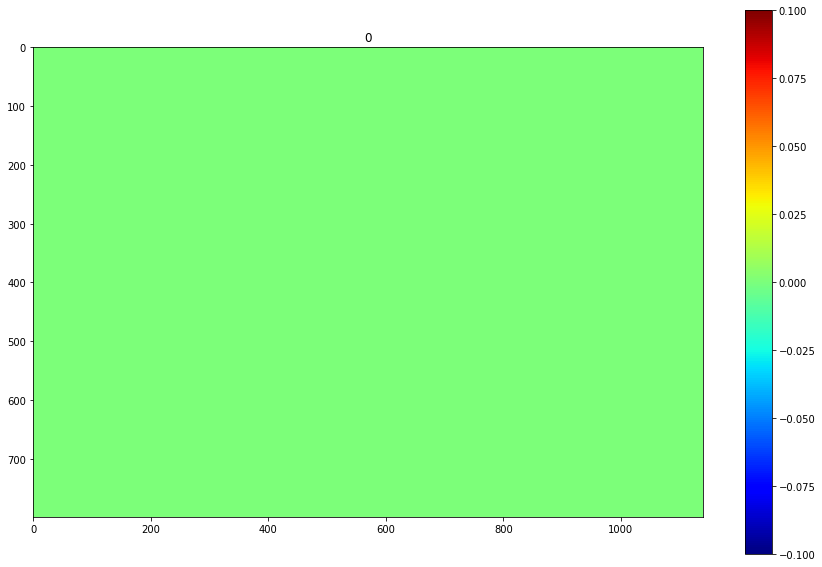

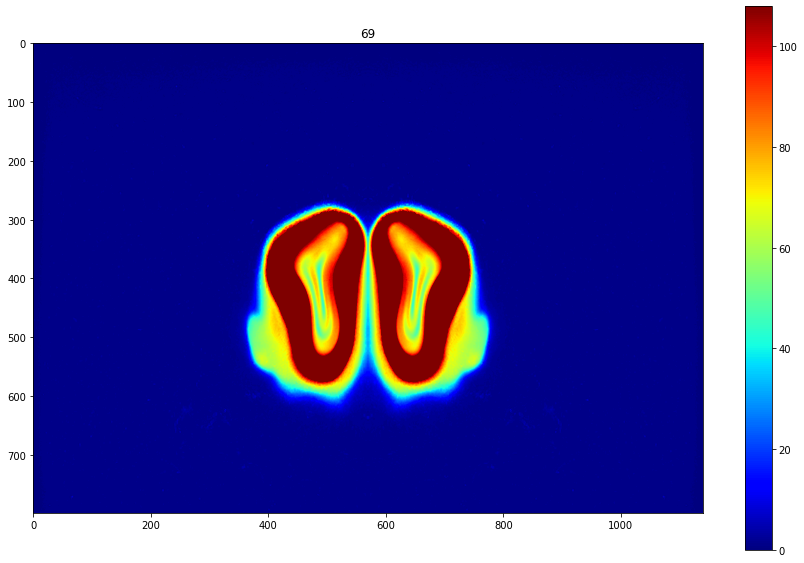

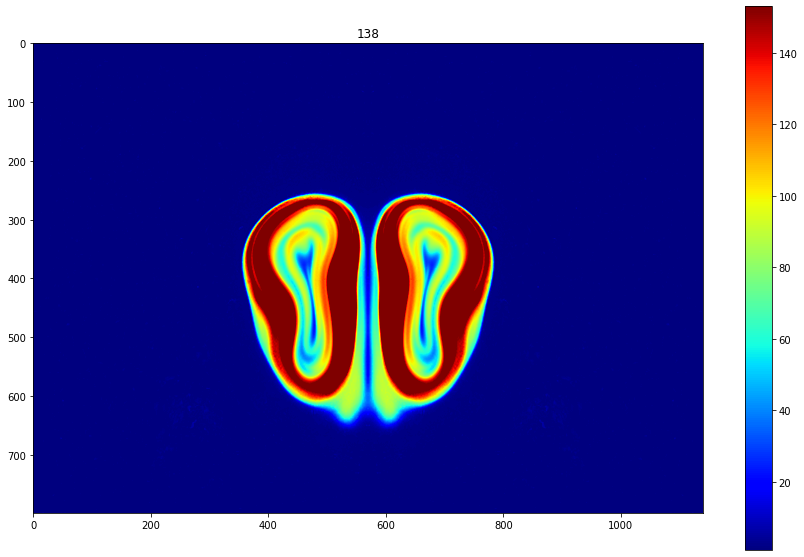

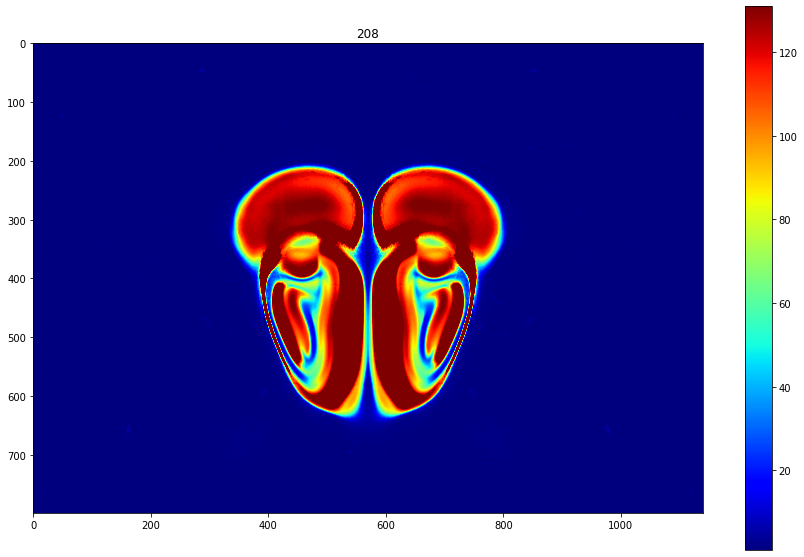

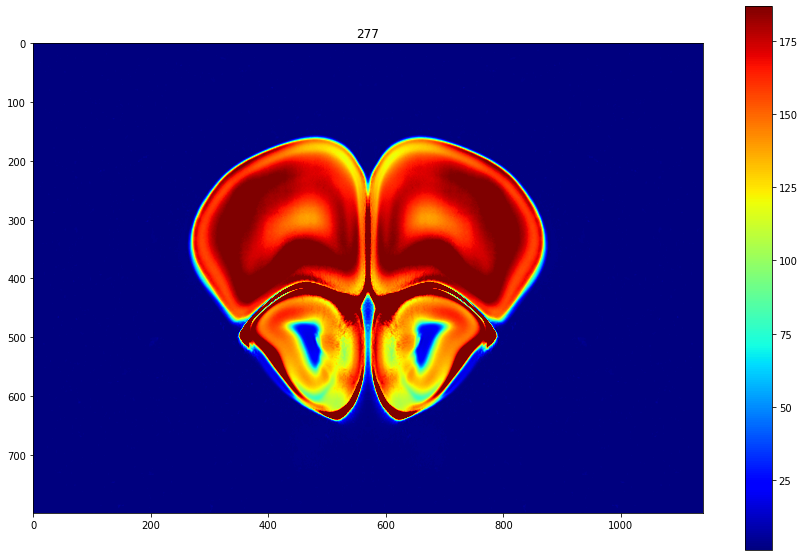

...

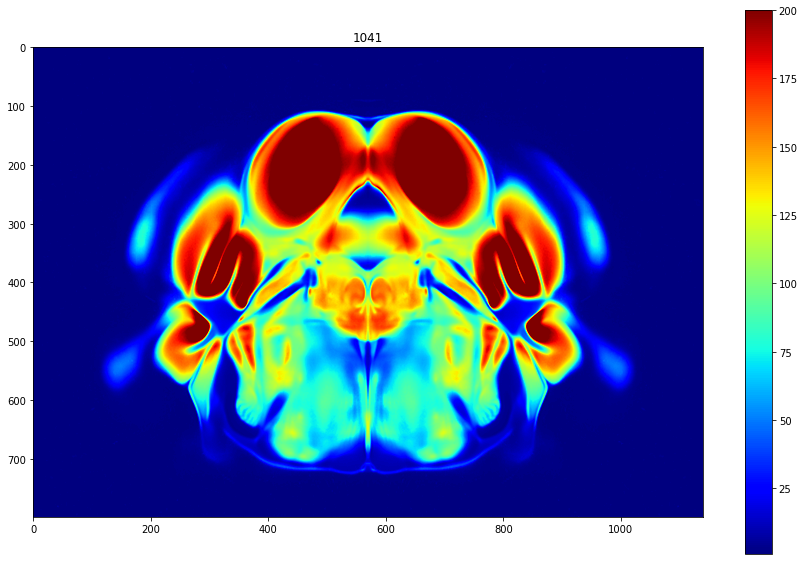

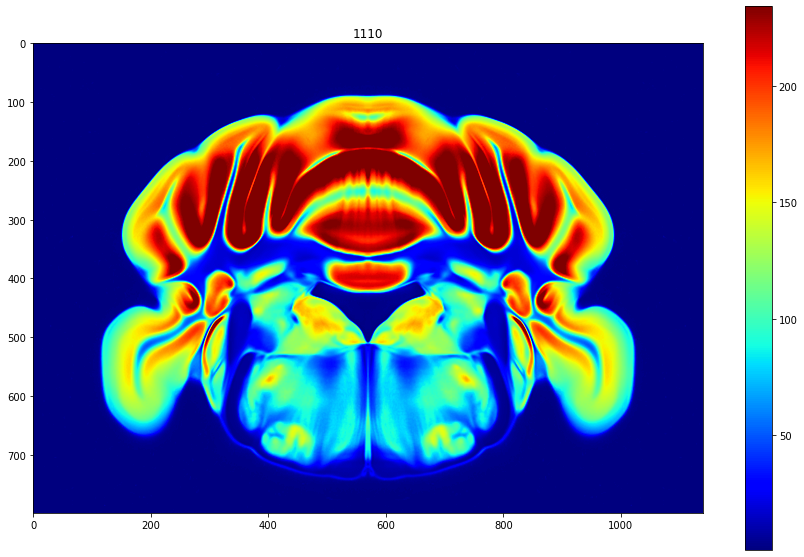

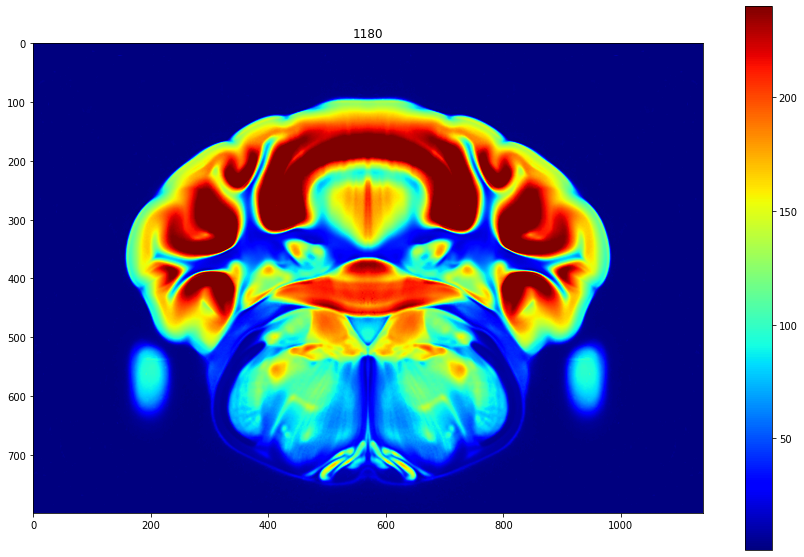

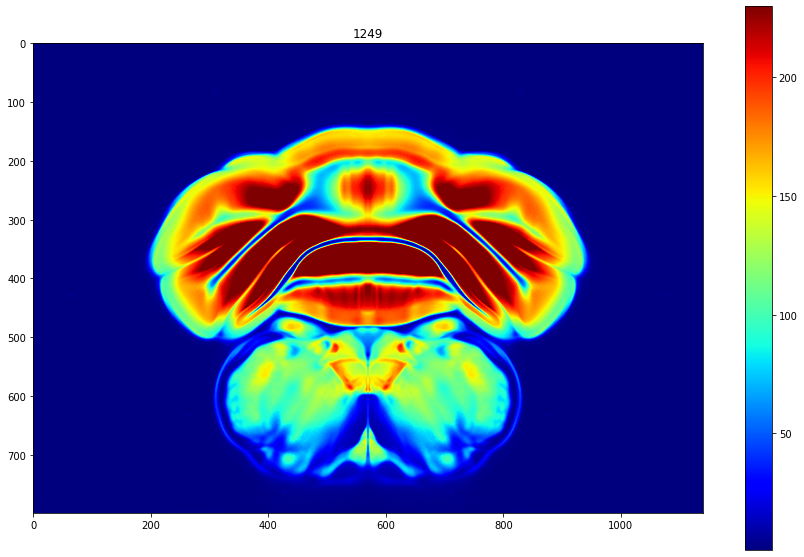

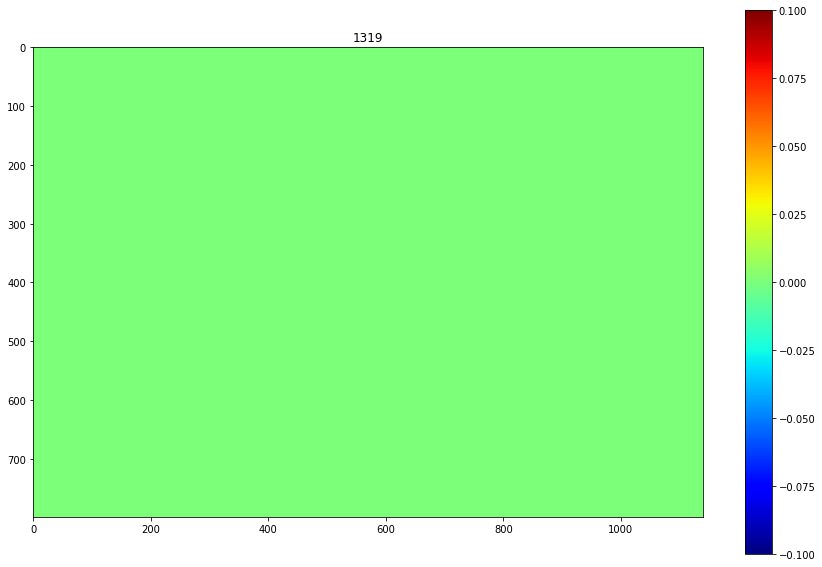

In [13]:
volume = average_template
for z in np.linspace(0,volume.shape[0]-1,20):
    z = int(z)
    img = volume[z,:,:].copy()
    plt.figure(figsize=[15,10])
    plt.title(z)
    plt.imshow(img, cmap='jet',vmin=np.percentile(img.ravel(),5),vmax=np.percentile(img.ravel(),95))
    plt.colorbar()
    plt.show()

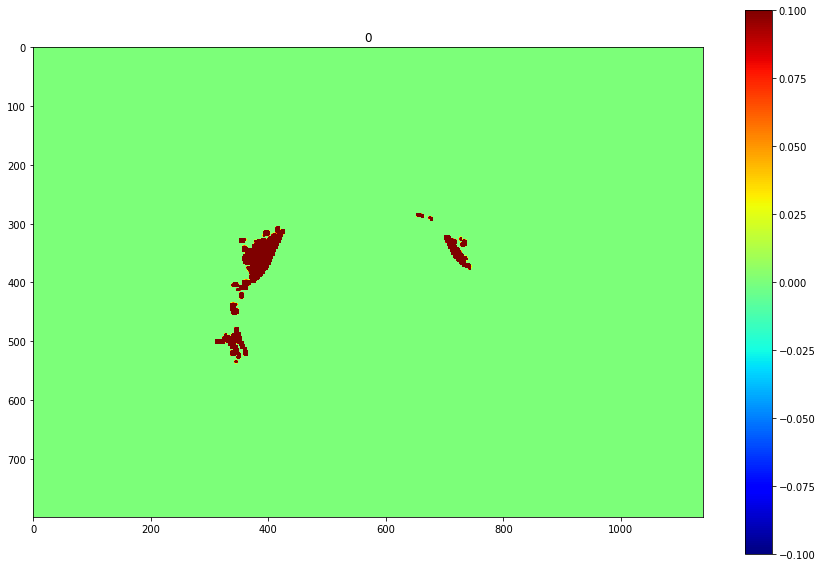

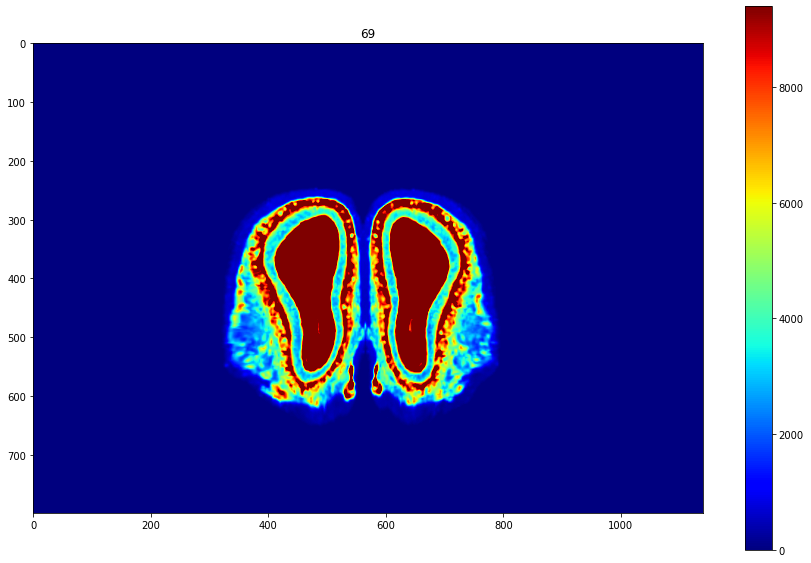

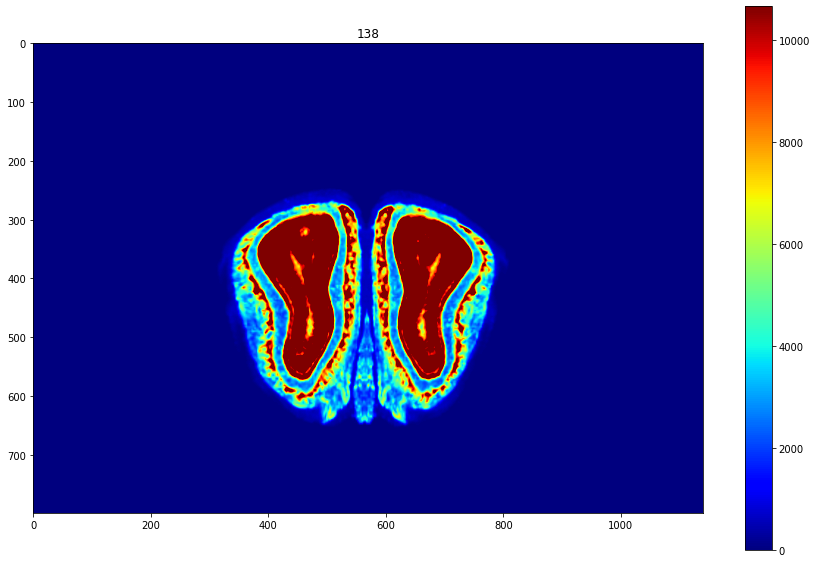

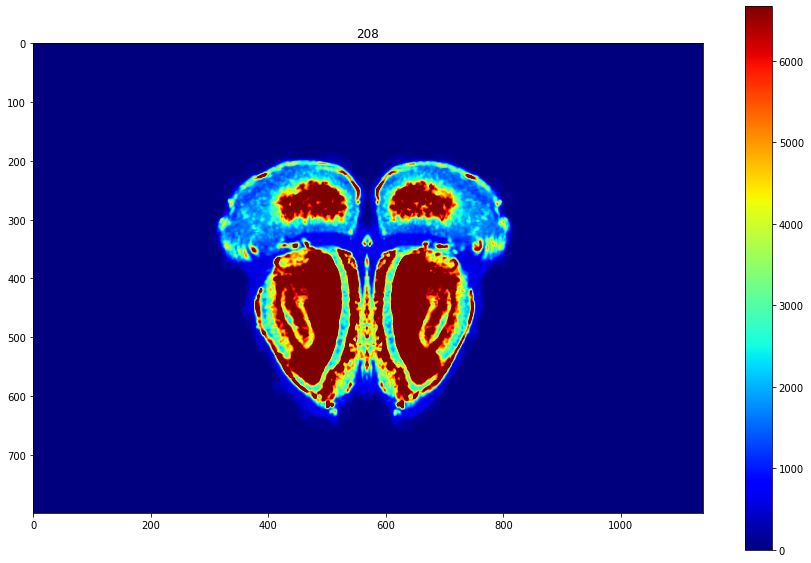

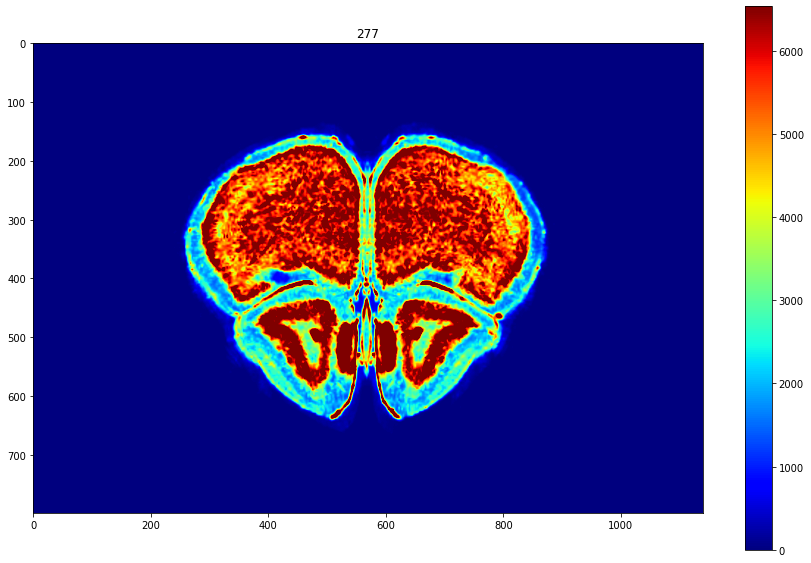

...

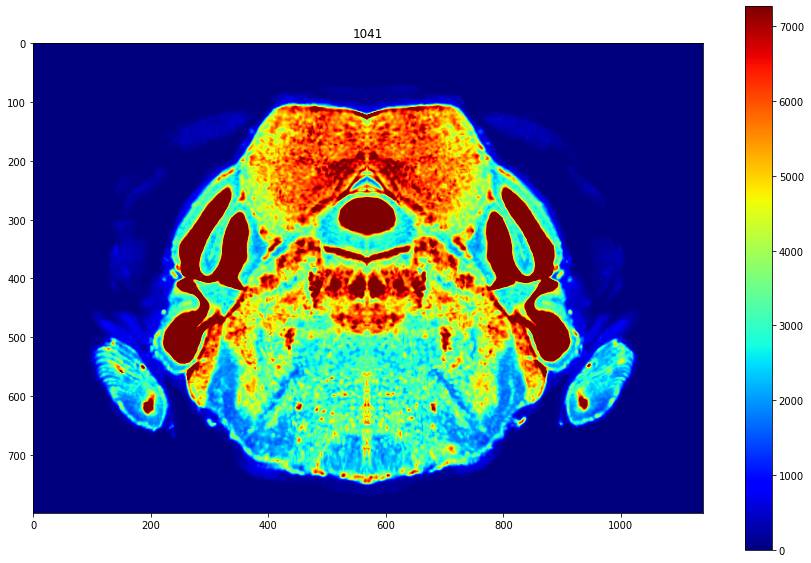

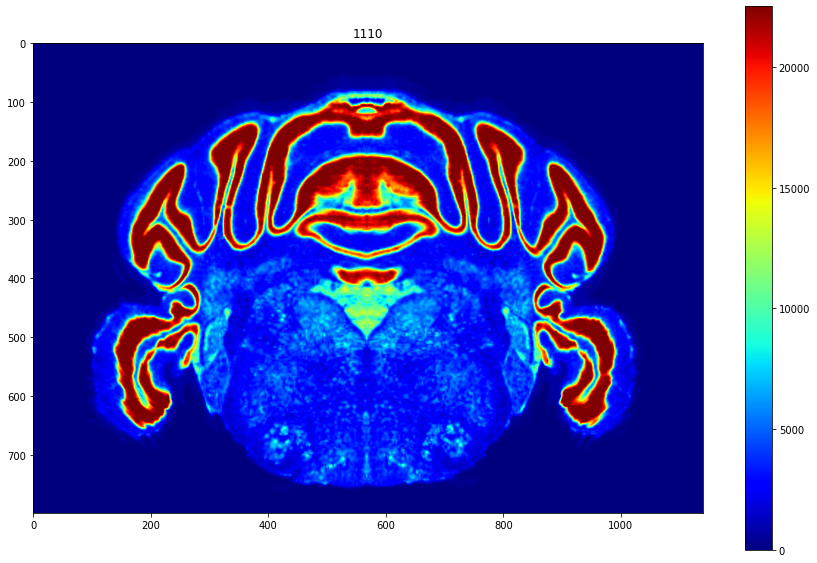

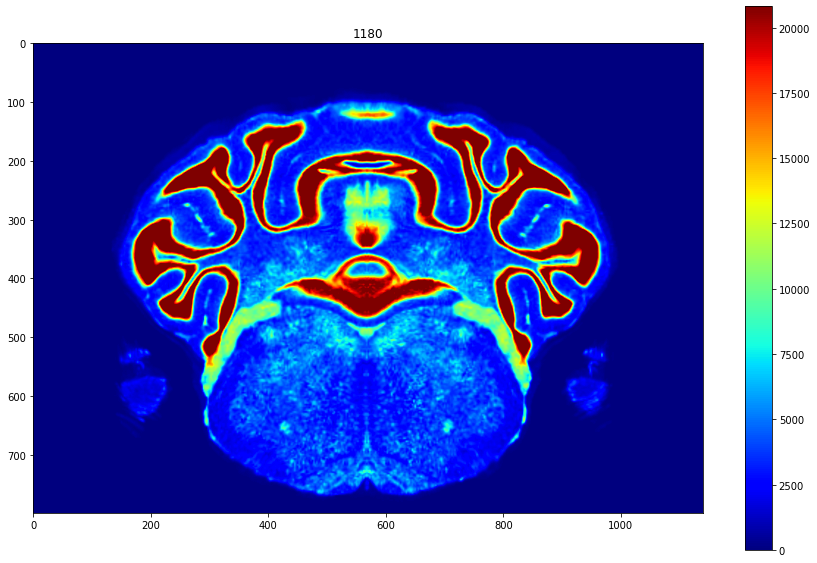

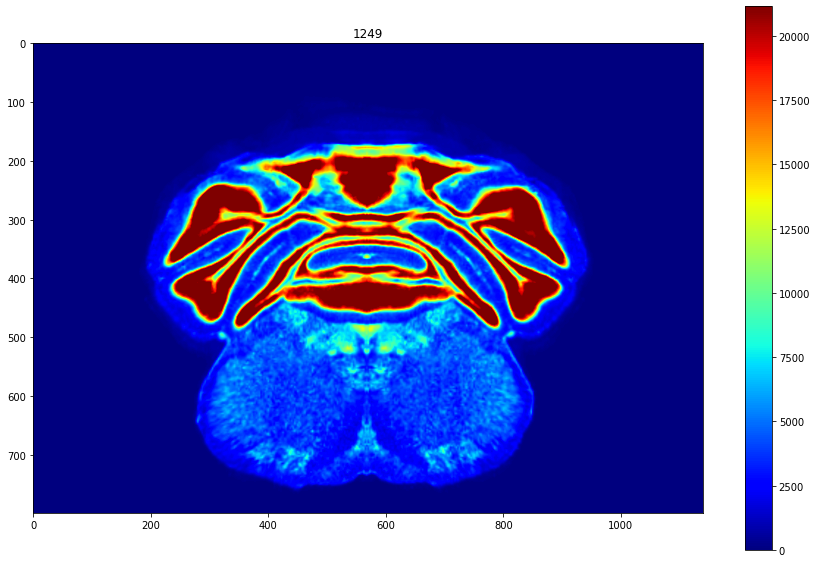

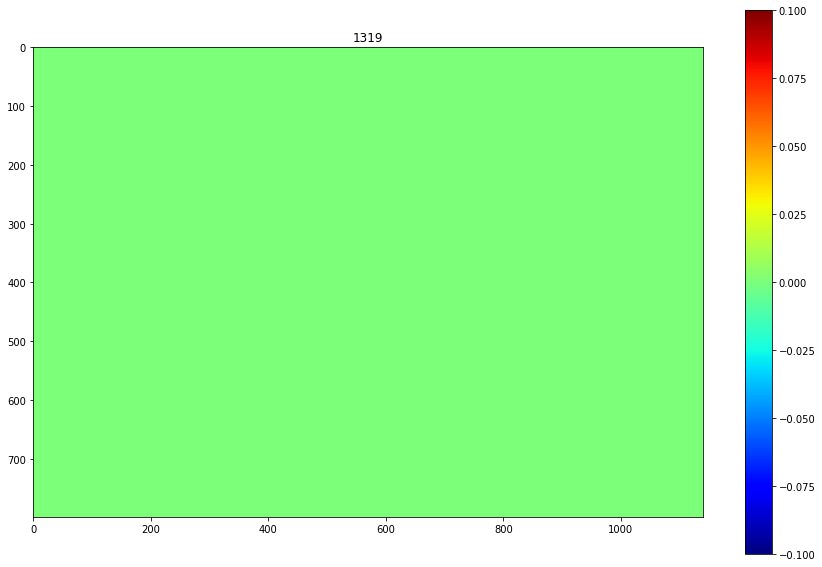

In [14]:
volume = ara_nissl
for z in np.linspace(0,volume.shape[0]-1,20):
    z = int(z)
    img = volume[z,:,:].copy()
    plt.figure(figsize=[15,10])
    plt.title(z)
    plt.imshow(img, cmap='jet',vmin=np.percentile(img.ravel(),5),vmax=np.percentile(img.ravel(),95))
    plt.colorbar()
    plt.show()

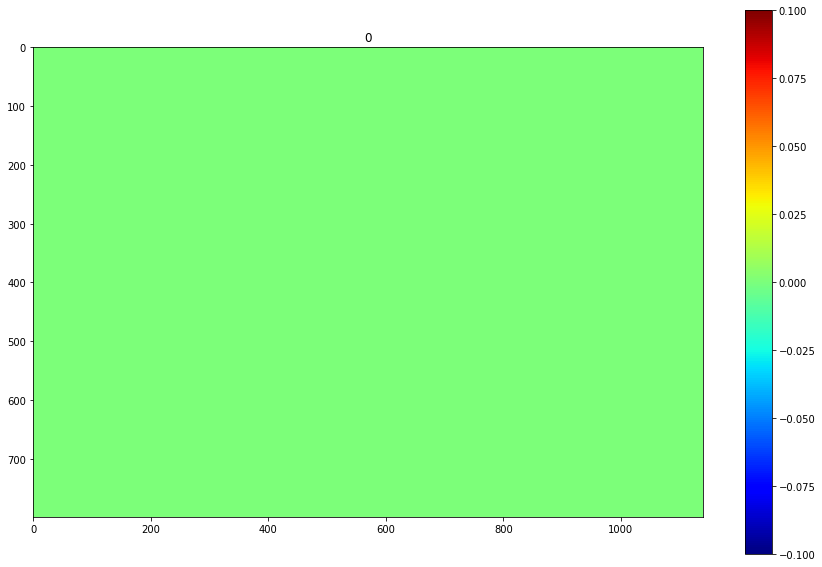

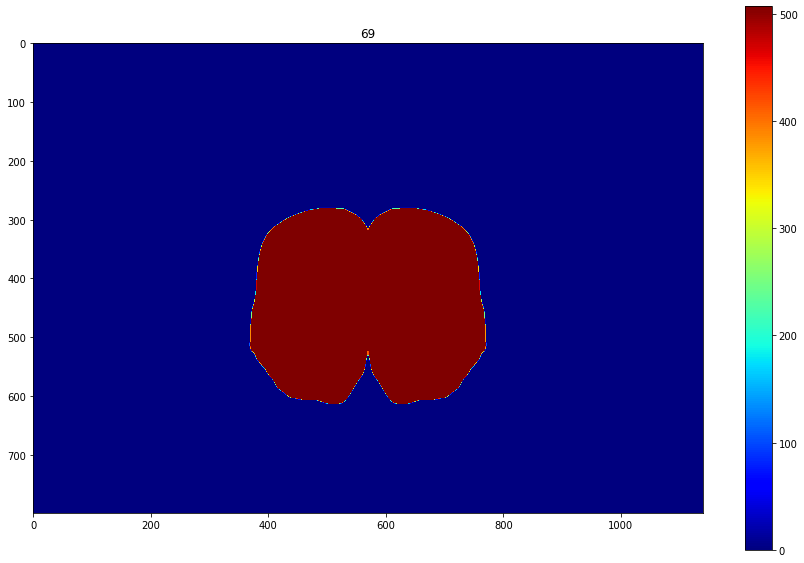

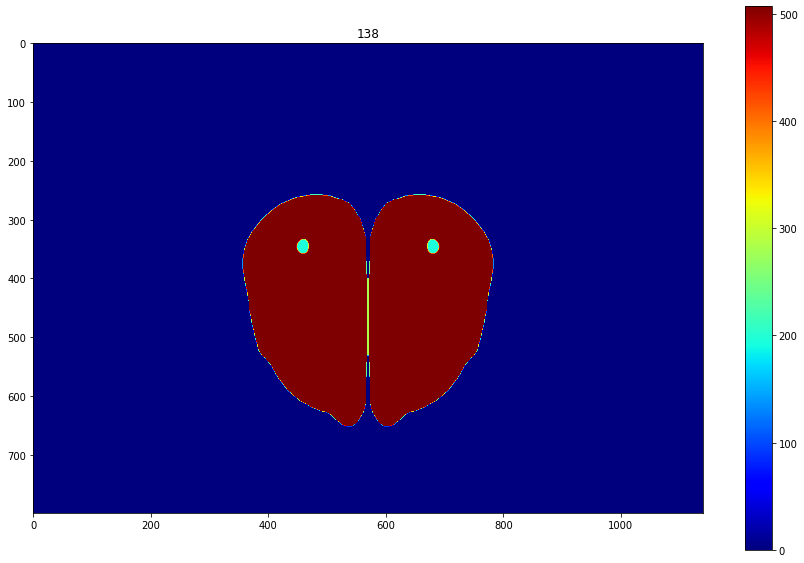

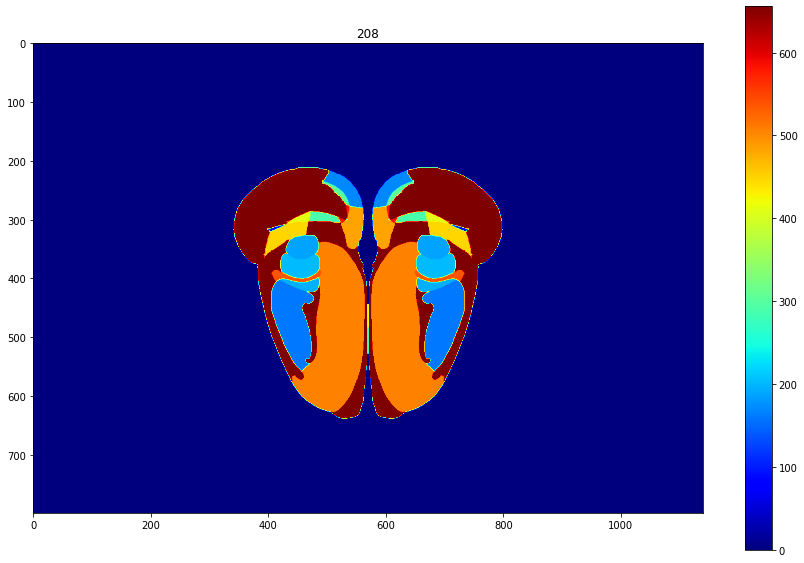

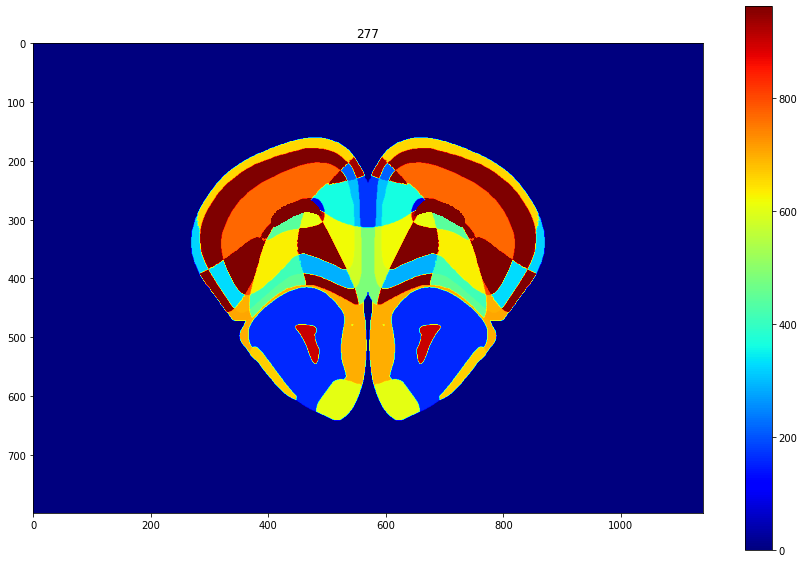

...

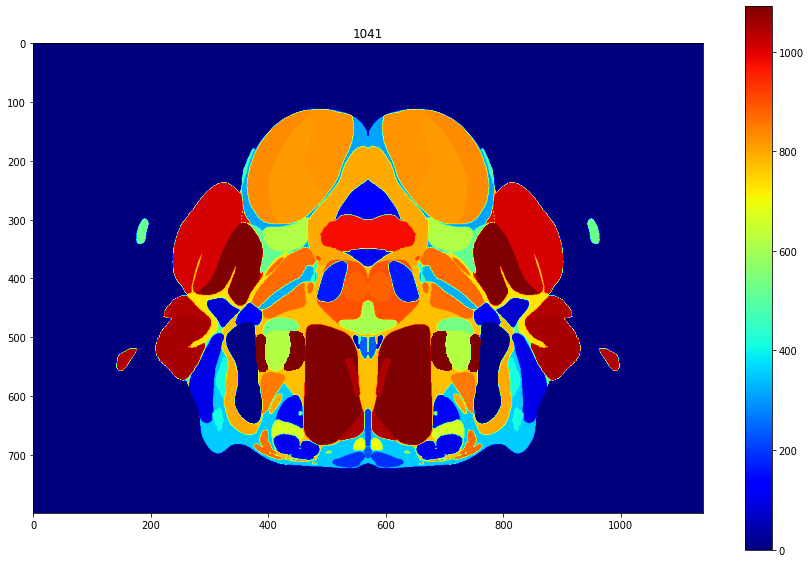

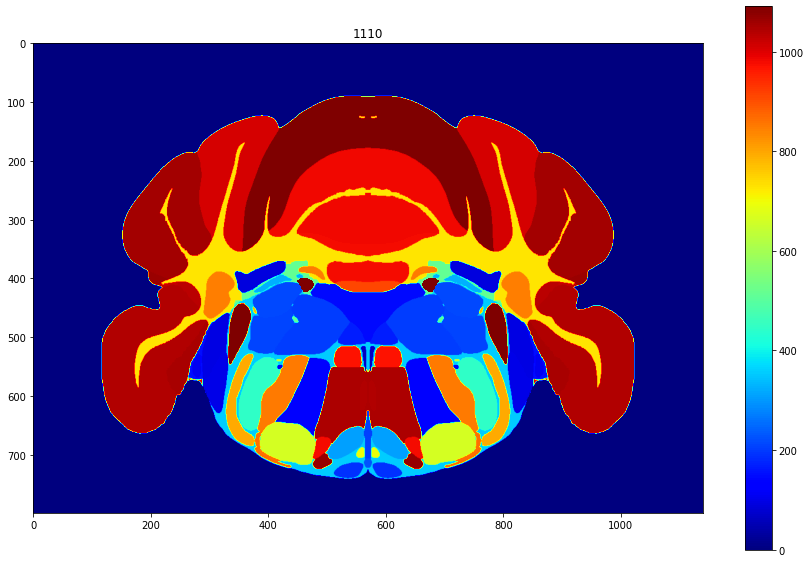

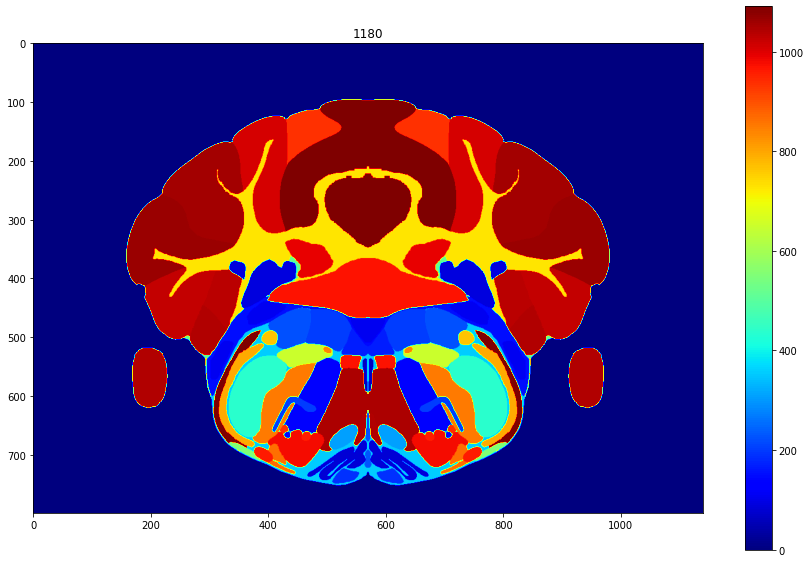

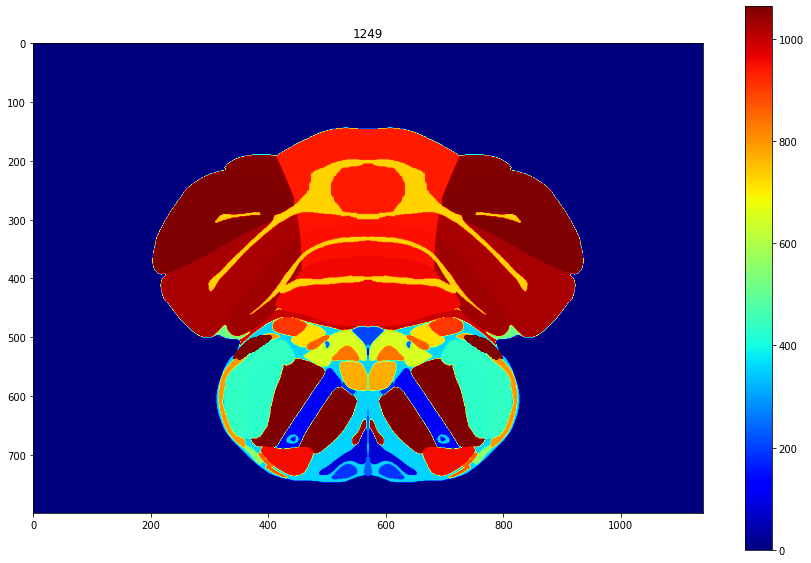

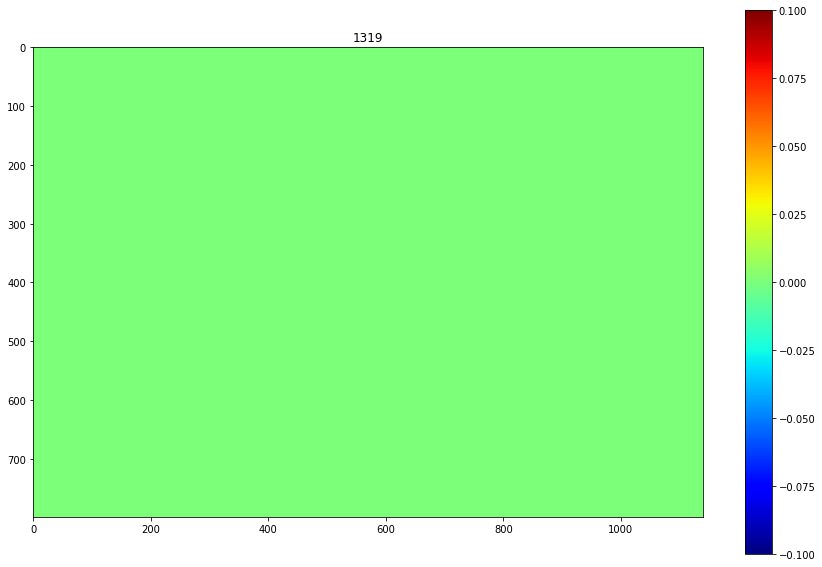

In [15]:
volume = rsp.annotation
for z in np.linspace(0,volume.shape[0]-1,20):
    z = int(z)
    img = volume[z,:,:].copy()
    plt.figure(figsize=[15,10])
    plt.title(z)
    plt.imshow(img, cmap='jet',vmin=np.percentile(img.ravel(),5),vmax=np.percentile(img.ravel(),95))
    plt.colorbar()
    plt.show()

In [27]:
annotation, meta = rspc.get_annotation_volume()

In [31]:
annotation.shape

(1320, 800, 1140)

In [28]:
meta

OrderedDict([('type', 'unsigned int'),
             ('dimension', 3),
             ('space', 'left-posterior-superior'),
             ('sizes', array([1320,  800, 1140])),
             ('space directions',
              array([[10.,  0.,  0.],
                     [ 0., 10.,  0.],
                     [ 0.,  0., 10.]])),
             ('kinds', ['domain', 'domain', 'domain']),
             ('endian', 'little'),
             ('encoding', 'gzip'),
             ('space origin', array([0., 0., 0.])),
             ('ITK_InputFilterName', 'NrrdImageIO')])

In [32]:
# ID 1 is the adult mouse structure graph
tree = rspc.get_structure_tree(structure_graph_id=1) 

In [34]:
""" Important """
tree.get_name_map()

{997: 'root',
 8: 'Basic cell groups and regions',
 567: 'Cerebrum',
 688: 'Cerebral cortex',
 695: 'Cortical plate',
 315: 'Isocortex',
 184: 'Frontal pole, cerebral cortex',
 68: 'Frontal pole, layer 1',
 667: 'Frontal pole, layer 2/3',
 526157192: 'Frontal pole, layer 5',
 526157196: 'Frontal pole, layer 6a',
 526322264: 'Frontal pole, layer 6b',
 500: 'Somatomotor areas',
 107: 'Somatomotor areas, Layer 1',
 219: 'Somatomotor areas, Layer 2/3',
 299: 'Somatomotor areas, Layer 5',
 644: 'Somatomotor areas, Layer 6a',
 947: 'Somatomotor areas, Layer 6b',
 985: 'Primary motor area',
 320: 'Primary motor area, Layer 1',
 943: 'Primary motor area, Layer 2/3',
 648: 'Primary motor area, Layer 5',
 844: 'Primary motor area, Layer 6a',
 882: 'Primary motor area, Layer 6b',
 993: 'Secondary motor area',
 656: 'Secondary motor area, layer 1',
 962: 'Secondary motor area, layer 2/3',
 767: 'Secondary motor area, layer 5',
 1021: 'Secondary motor area, layer 6a',
 1085: 'Secondary motor area, 

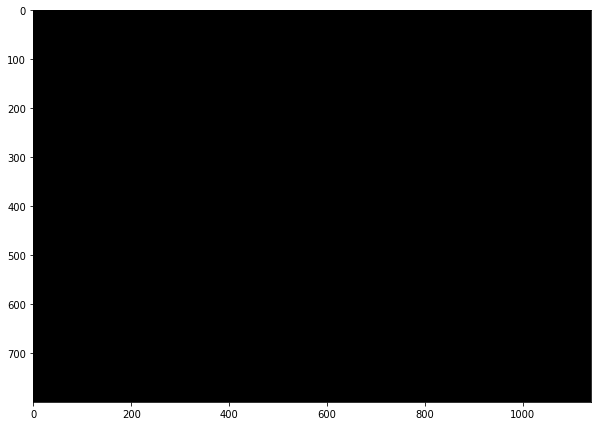

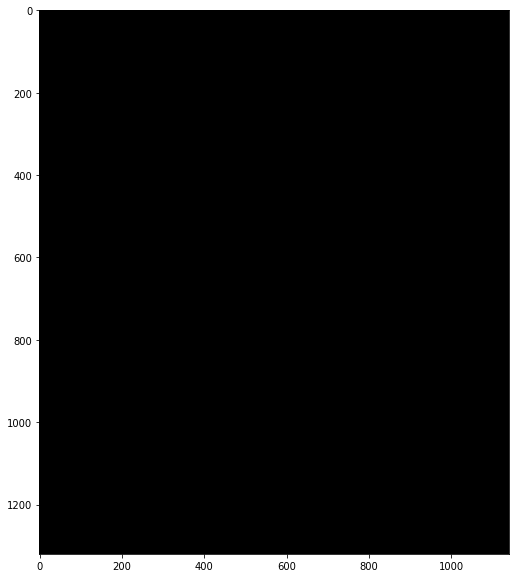

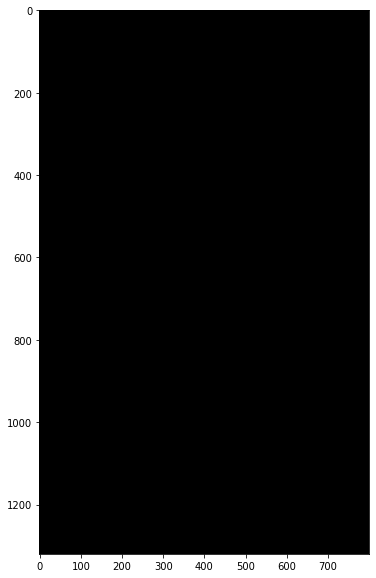

In [46]:
# A complete mask for one structure
mask = 1*(rsp.annotation==407)

# view in coronal section
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(0), interpolation='none', cmap=plt.cm.afmhot)
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(1), interpolation='none', cmap=plt.cm.afmhot)
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(2), interpolation='none', cmap=plt.cm.afmhot)

In [45]:
tree.get_structures_by_id([407])

[{'acronym': 'CA1sp',
  'graph_id': 1,
  'graph_order': 460,
  'id': 407,
  'name': 'Field CA1, pyramidal layer',
  'structure_id_path': [997, 8, 567, 688, 695, 1089, 1080, 375, 382, 407],
  'structure_set_ids': [10, 12],
  'rgb_triplet': [102, 168, 61]}]

In [36]:
tree.get_structures_by_name(['Field CA1, pyramidal layer'])

[{'acronym': 'CA1sp',
  'graph_id': 1,
  'graph_order': 460,
  'id': 407,
  'name': 'Field CA1, pyramidal layer',
  'structure_id_path': [997, 8, 567, 688, 695, 1089, 1080, 375, 382, 407],
  'structure_set_ids': [10, 12],
  'rgb_triplet': [102, 168, 61]}]

In [37]:
tree.parents([407])

[{'acronym': 'CA1',
  'graph_id': 1,
  'graph_order': 457,
  'id': 382,
  'name': 'Field CA1',
  'structure_id_path': [997, 8, 567, 688, 695, 1089, 1080, 375, 382],
  'structure_set_ids': [112905828,
   691663206,
   688152359,
   687527945,
   12,
   184527634,
   112905813,
   167587189,
   114512891,
   114512892],
  'rgb_triplet': [126, 208, 75]}]

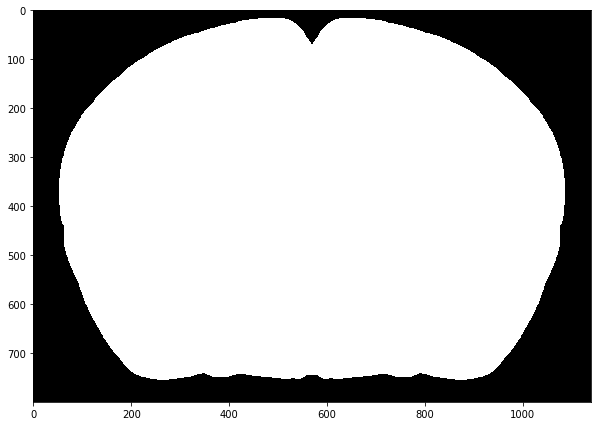

In [42]:
# A complete mask for one structure
mask = rsp.make_structure_mask([997])

# view in coronal section
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(0), interpolation='none', cmap=plt.cm.afmhot)

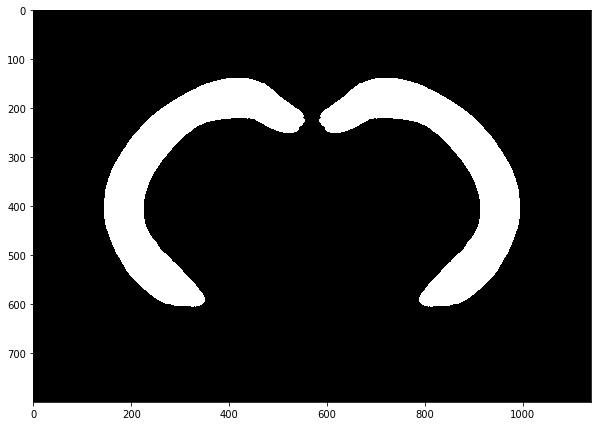

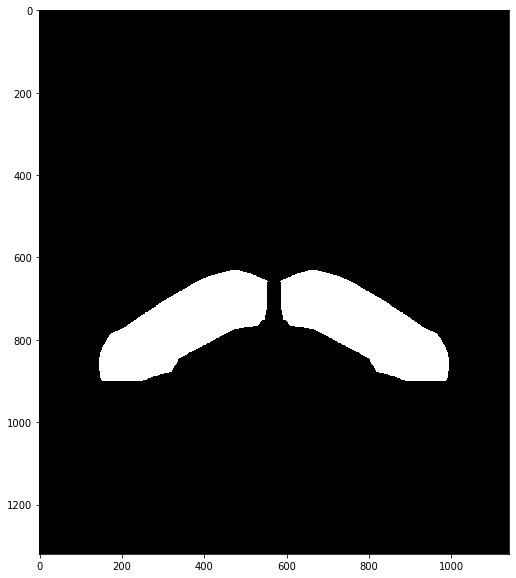

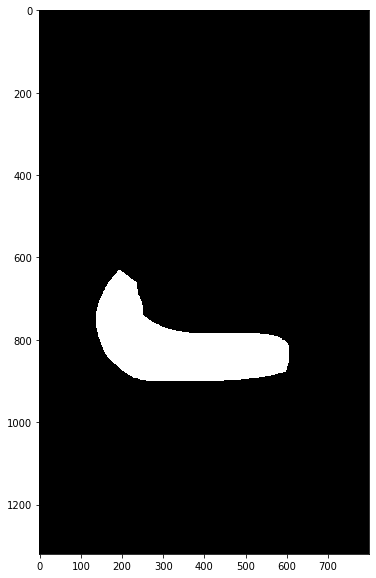

In [44]:
# A complete mask for one structure
mask = rsp.make_structure_mask([382])

# view in coronal section
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(0), interpolation='none', cmap=plt.cm.afmhot)
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(1), interpolation='none', cmap=plt.cm.afmhot)
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(mask.max(2), interpolation='none', cmap=plt.cm.afmhot)

In [ ]:
""" Load Data [Neuron Locations]"""
""" Bin to Resolution """
""" Center Image """ # Save Translation
""" Rotate Image """ # Save Rotation
""" Cross Correlation with All Sections """ # Save Z Transform
""" Transform with Matched Section """ # Save XY Transform
""" Convert Stage Coordinates to CCV3